Check this link for original Google Colab Notebook: https://colab.research.google.com/drive/1iqtI2cPKJ41NYrOKDqP_-qFkqu105MAQ?usp=sharing

In [2]:
%pip install opencv-python

ERROR: Operation cancelled by user


In [3]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import files
from google.colab.patches import cv2_imshow

LAB-1

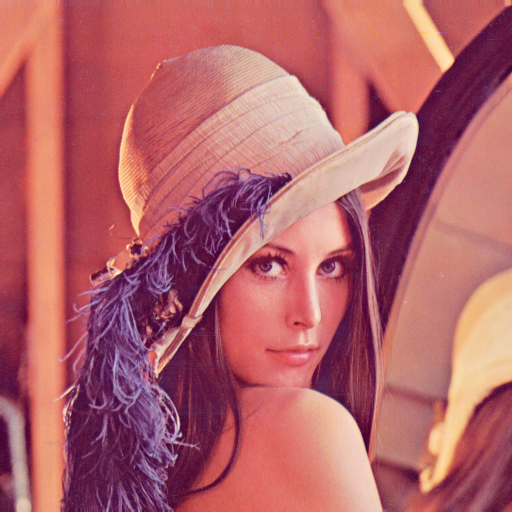

In [4]:
img = cv2.imread("/content/drive/MyDrive/DIPLab/Lenna_(test_image).png")

if img is None:
    print("Error: Image could not be loaded. Please check the file path and ensure the image exists and is accessible.")
else:
    cv2_imshow(img)
    cv2.imwrite("output.jpg", img)

LAB-2

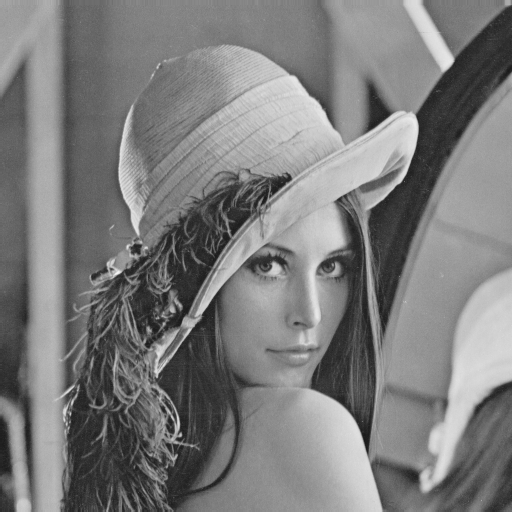

In [5]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2.imwrite("gray_image.jpg", gray)
cv2_imshow(gray)


LAB-3

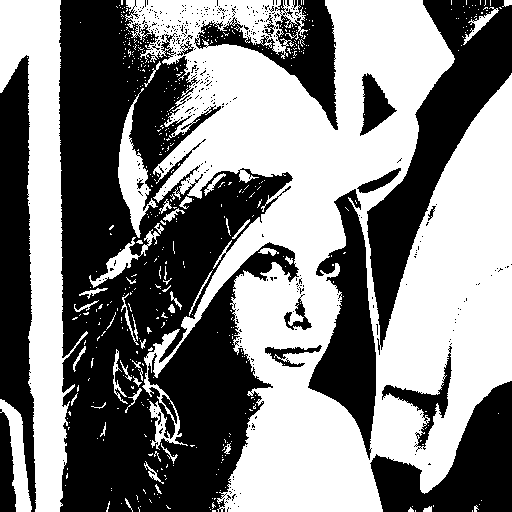

'\nplt.hist(mat.ravel(),256,[0,256])\nplt.show()'

In [6]:
import numpy as np
(m,n) = np.shape(gray)
mat = np.zeros([m,n])
for i in range(m):
  for j in range(n):
    if gray[i,j]>127:
      mat[i,j] = 255
    else:
      mat[i,j] = 0
cv2.imwrite("B&W.png", mat)
cv2_imshow(mat)
'''
plt.hist(mat.ravel(),256,[0,256])
plt.show()'''

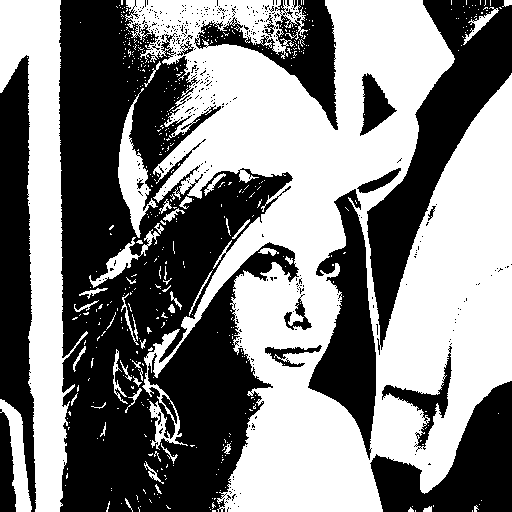

True

In [7]:
th, bw_img = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
cv2_imshow(bw_img)
cv2.imwrite("bw_CV2.jpg", bw_img)
#plt.hist(bw_img.ravel(),256,[0,256])
#plt.show()

LAB-4

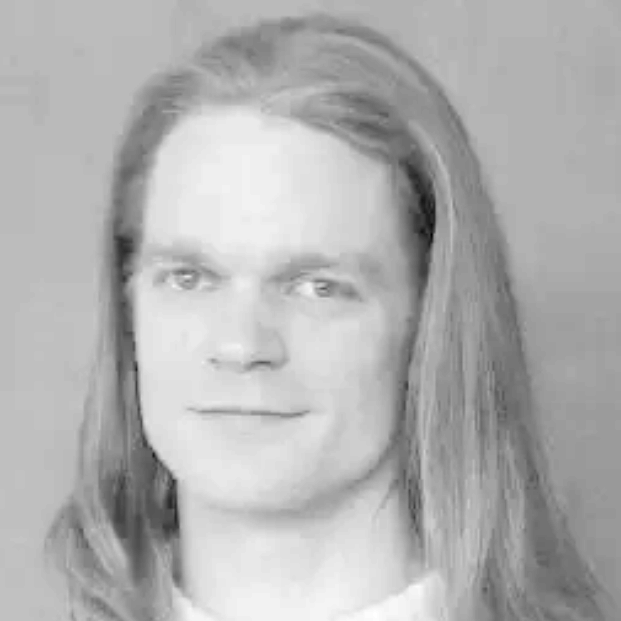

In [8]:
low_img= cv2.imread('/content/drive/MyDrive/DIPLab/lowcontrast.png', 0)
low_img = low_img.astype(np.float32)
(m,n) = np.shape(low_img)
mat_1 = np.zeros([m,n])
min_o = np.min(low_img)
max_o = np.max(low_img)
diff_o = max_o - min_o
for i in range(m):
  for j in range(n):
    mat_1[i,j] = (((low_img[i,j] - min_o) * 255) / diff_o)

mat_1 = np.clip(mat_1, 0, 255)
mat_1 = mat_1.astype(np.uint8)
cv2.imwrite("contrast_stretch.png", mat_1)
cv2_imshow(mat_1)

LAB-5

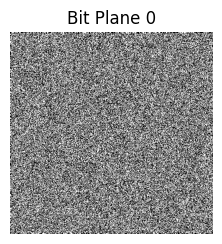

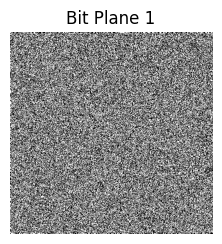

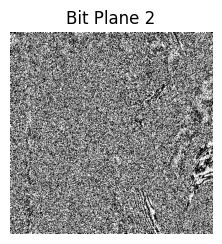

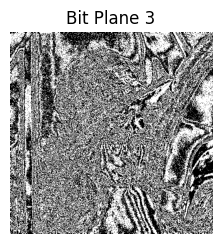

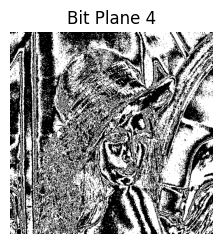

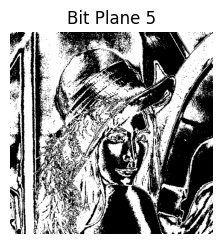

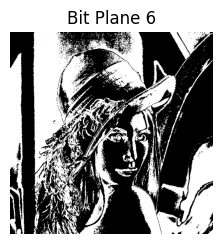

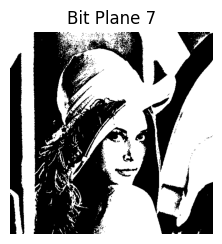

In [9]:
bit_planes = []
for i in range(8):
  bit_plane = np.bitwise_and(gray, 2**i)
  bit_planes.append(bit_plane)
  plt.figure(figsize=(12,6))

  plt.subplot(2, 4, i+1 )
  plt.imshow(bit_plane, cmap='gray')
  plt.title(f'Bit Plane {i}')
  plt.axis('off')



LAB 6

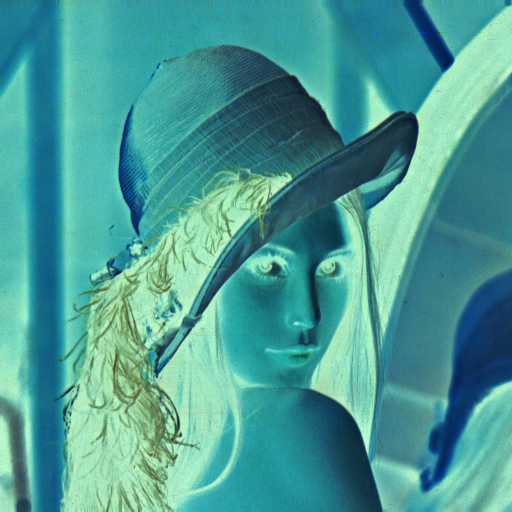

In [10]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img_norm = img/255.0

#Negative
negative = 255 - img

cv2_imshow(negative)

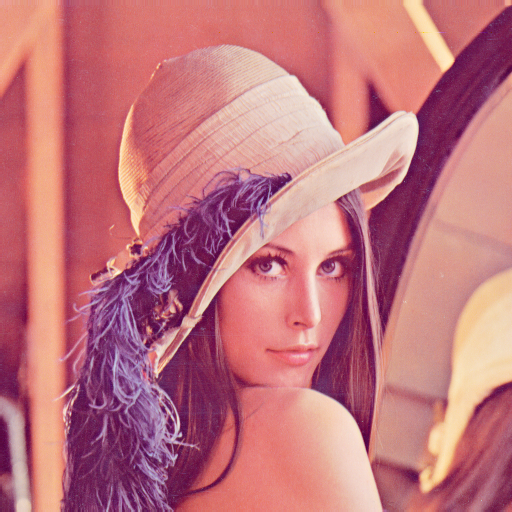

In [11]:
#Log Transformation
log_trans = np.log1p(img_norm)
log_trans = np.uint8(255*log_trans/np.max(log_trans))
cv2_imshow(log_trans)

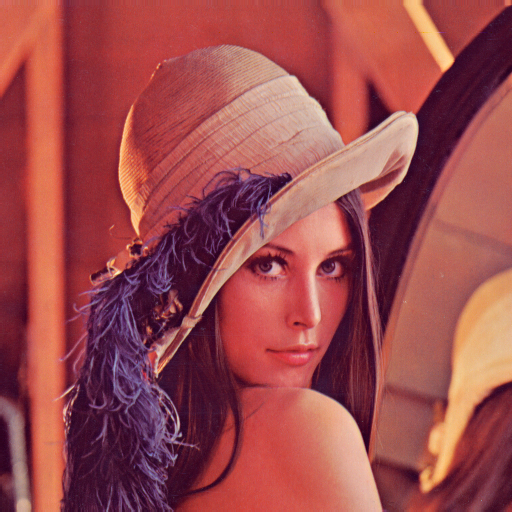

In [12]:
#antilog
antilog = np.expm1(img_norm)
antilog = np.uint8(255*antilog/np.max(antilog))
cv2_imshow(antilog)

Enter gamma value: 2


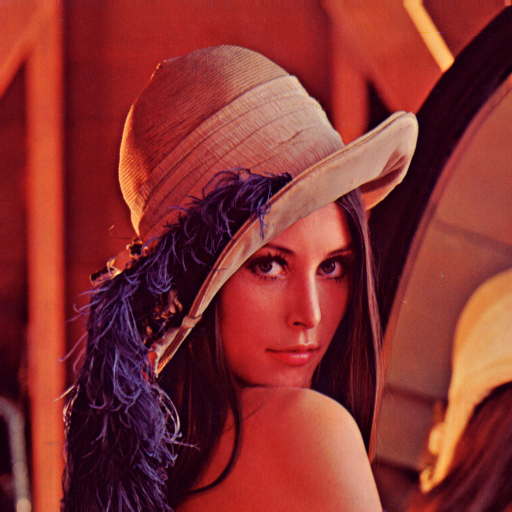

In [13]:
#Gamma
gamma = float(input("Enter gamma value: "))
power = np.power(img_norm, gamma)
power = np.uint8(255*power)
cv2_imshow(power)

Enter n value: 2


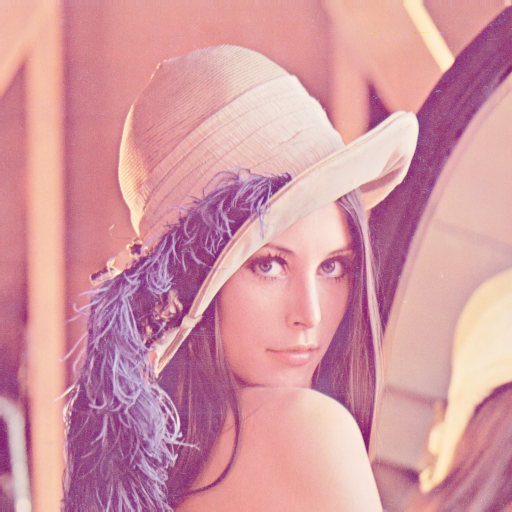

In [14]:
#N_th Root
n= float(input("Enter n value: "))
nth_root = np.power(img_norm, 1/n)
nth_root = np.uint8(255*nth_root/np.max(nth_root))
cv2_imshow(nth_root)

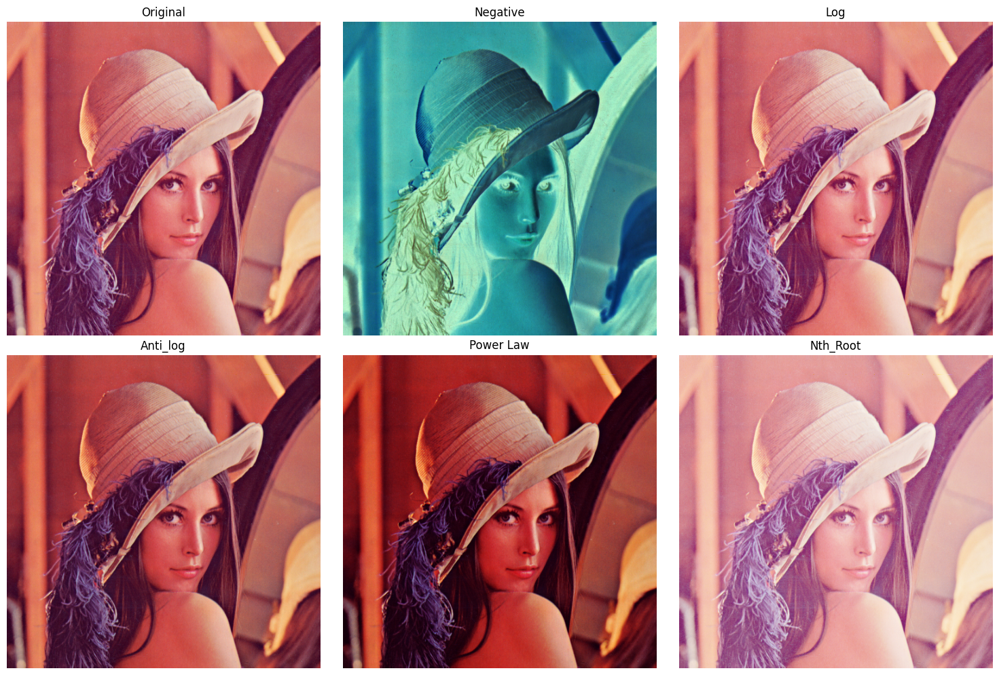

In [15]:
titles = ['Original','Negative','Log',"Anti_log",'Power Law', 'Nth_Root']
images = [img, negative, log_trans, antilog, power, nth_root]

plt.figure(figsize=(15, 10))
for i in range(len(images)):
    plt.subplot(2, 3, i + 1)
    if len(images[i].shape) == 3:
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

LAB 7

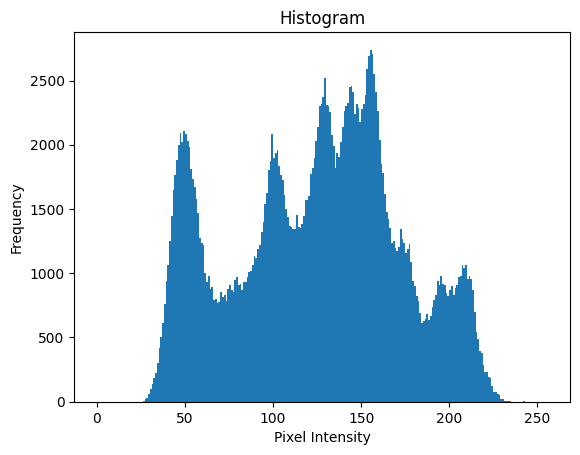

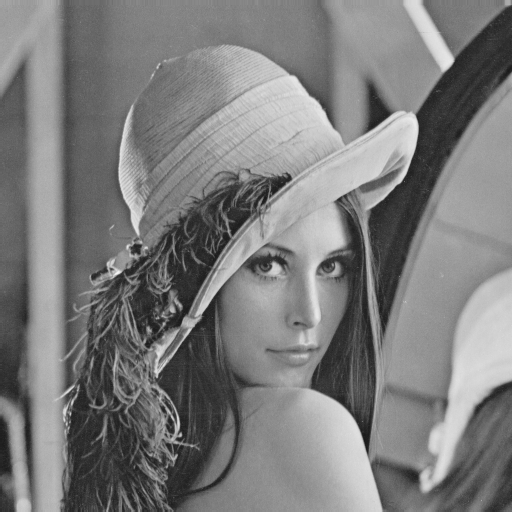

In [16]:
#histogram plt
plt.hist(gray.ravel(),bins=256,range=[0,256])
plt.title("Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()
cv2_imshow(gray)

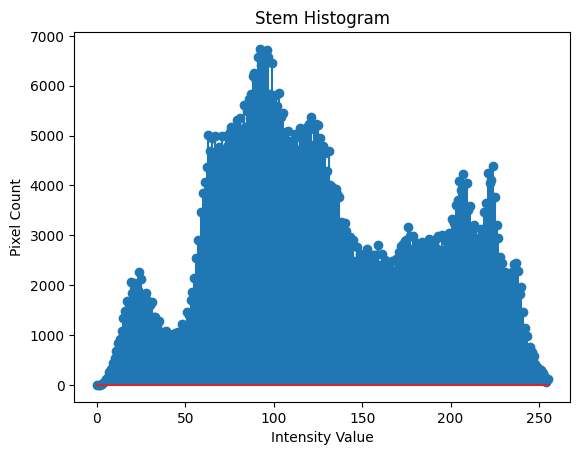

In [17]:
#Stem Histogram

hist, bins = np.histogram(img.flatten(),256, [0,256])
plt.stem(hist)
plt.title("Stem Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.show()

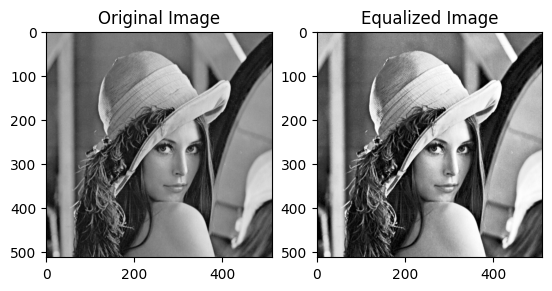

In [18]:
#Histogram Equalize
equalized = cv2.equalizeHist(gray)
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(gray, cmap='gray')
plt.subplot(1,2,2)
plt.title("Equalized Image")
plt.imshow(equalized, cmap='gray')
plt.show()

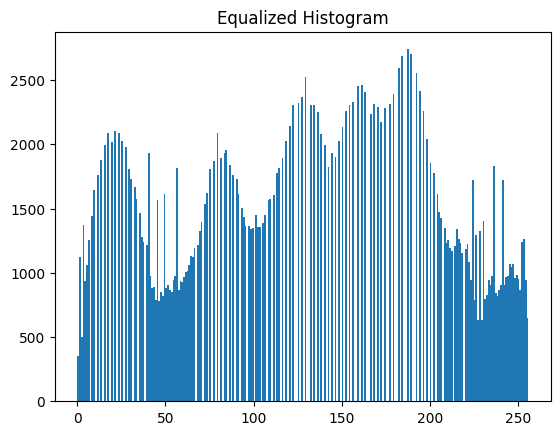

In [19]:
plt.hist(equalized.ravel(),bins=256,range=[0,256])
plt.title("Equalized Histogram")
plt.show()

LAB-8

In [20]:
kernel = np.array([[1, 0, -1],
                   [1, 0, -1],
                   [1, 0, -1]])

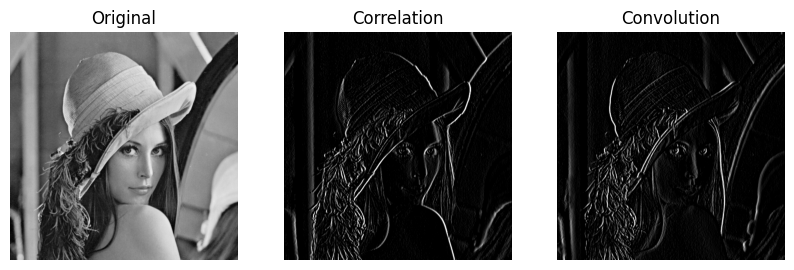

In [21]:
correlation = cv2.filter2D(gray, -1, kernel)
kernel_flipped = np.flipud(np.fliplr(kernel))
convolution = cv2.filter2D(gray, -1, kernel_flipped)

plt.figure(figsize=(10,5))

plt.subplot(1,3,1)
plt.imshow(gray, cmap='gray')
plt.title('Original')
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(correlation, cmap='gray')
plt.title('Correlation')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(convolution, cmap='gray')
plt.title('Convolution')
plt.axis('off')

plt.show()


LAB-9

In [22]:
#Average Filter

avg = cv2.blur(gray, (3,3))

#Gaussian Filter

gaussian = cv2.GaussianBlur(gray, (5,5), 0)

#Median Filter

median = cv2.medianBlur(gray, 5)


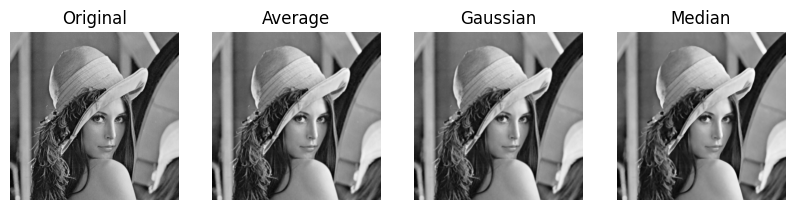

In [24]:
plt.figure(figsize=(10,5))

plt.subplot(1,4,1)
plt.imshow(gray, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(avg, cmap='gray')
plt.title('Average')
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(gaussian, cmap='gray')
plt.title('Gaussian')
plt.axis('off')
plt.subplot(1,4,4)
plt.imshow(median, cmap='gray')
plt.title('Median')
plt.axis('off')

plt.show()